In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd
from PIL import Image

## Machine learning related libraries:
import torch
import torch.nn as nn                         # base class used to develop all neural network models
import torch.nn.functional as F               # module of relu activation functions
import torch.optim as optim                   # module of Adam optimizer
from tqdm.notebook import tqdm                # progress meter - wrap any iterable with tqdm(iterable)
from itertools import chain                   # append two range() functions
from torch.utils.data import DataLoader       # easy and organized data loading to the ML model
from torch.utils.data import Dataset  
from torch.utils.data import random_split
# for nice loadable dataset creation

## Visualization libraries:
from IPython import display
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity='last'

%matplotlib inline

In [2]:
with open('./mlqe_2023_edx/week2/dataset/windows.npy', 'rb') as f:
    data = np.load(f)

with open('./mlqe_2023_edx/week2/dataset/labels.txt', 'r') as f:
    labels = np.loadtxt(f, dtype = int)

print(data.shape, labels.shape)

# labels is a list of 60000 numbers refering to the classification of each data window 
# 0 1 2 or 3 meaning no lines, horizontal, vertical, both

(60000, 10, 10) (60000,)


In [3]:
label_dic = {0: 'none', 1: 'horizontal', 2: 'vertical', 3: 'both'}

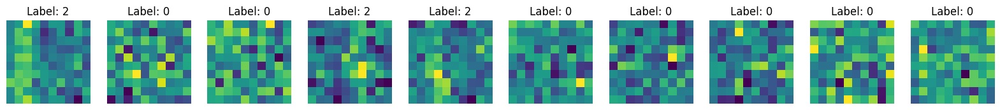

In [4]:
fig, ax = plt.subplots(1, 10, figsize=(20,10))
# we will look at the 10 images

# select a random set of 10 images to view
for index, d in enumerate(data[np.random.choice(len(data),size=10)]):
    ax[index].imshow(data[index])
    ax[index].axis('off')
    ax[index].set_title(f'Label: {(labels[index])}')
plt.show()
plt.close()

In [5]:
## Normalize to be in range [0,1]
for i, data_norm in enumerate(data):
    data_norm = data_norm - data_norm.min()   # subtract the minium to set the min value as 0
    data[i] = data_norm / data_norm.max()     # devide by the new maximum to get [0,1] max value goes to 1
data_norm = data

data = data_norm

## Transform to Tensors
data_norm, labels = torch.asarray(data_norm).float(), torch.asarray(labels).int()
print('Type of data: ', type(data_norm),', and labels: ', type(labels))                # check the type of data and labels after the transformation

data_norm = data_norm.view(data_norm.size()[0], 1,data_norm.size()[1], data_norm.size()[2])
print('New shape of data_norm: ', data_norm.size())                                    # check the shape of data and labels after the transformation

Type of data:  <class 'torch.Tensor'> , and labels:  <class 'torch.Tensor'>
New shape of data_norm:  torch.Size([60000, 1, 10, 10])


In [6]:
class CustomDataset(Dataset):
    def __init__(self, data, labels):
        # we pass data and labels when we initialize the class
        self.data = torch.Tensor(data)
        self.labels = torch.Tensor(labels)

    def __len__(self):
        # function that outputs length of dataset
        return len(self.data)

    def __getitem__(self, idx):
        # function that outputs data item with index idx
        # returns data, label
        data_idx = self.data[idx]
        label = self.labels[idx].type(torch.LongTensor)             # label must be output as datatype=Long (also known as int64)
        return data_idx, label

In [7]:

#### This is a more manual way of splitting data sets

indices = np.arange(labels.size()[0])                               # get the indices with the lenght of data/label array
np.random.shuffle(indices)                                          # shuffle the indices

train_test_ratio = 0.8
indices_train = indices[:int(len(indices)*train_test_ratio)]        # use 80% of the dataset as trainset
indices_test = indices[int(len(indices)*train_test_ratio):]         # and the rest as testset

## Use CustomDataset to create separate trainset and testset
trainset = CustomDataset(data_norm[indices_train], labels[indices_train])
testset = CustomDataset(data_norm[indices_test], labels[indices_test])

print('Size of trainset: ', trainset.labels.size()[0], ' and testset: ', testset.labels.size()[0])    # check the size of trainset and dataset



Size of trainset:  48000  and testset:  12000


In [8]:
batch_size = 64
trainloader = DataLoader(trainset, batch_size = batch_size)
testloader = DataLoader(testset, batch_size = batch_size)

In [9]:
## Get cpu or gpu device for training
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_built() else "cpu"
print(f"We are using {device} device")      # check the device we will use

We are using cpu device


In [10]:
### Building the CNN

In [11]:
class ConvNet(nn.Module):
    def __init__(self):

        # this line calls the __init__() of the nn class
        # nn.Module is the super class
        # ConvNet is the subclass
        # doing this basially initializes the nn module
        super(ConvNet, self).__init__()

        self.conv_stack = nn.Sequential(
                          nn.Conv2d(in_channels = 1,
                                    out_channels = 8,
                                    kernel_size = 3,
                                    stride = 2,
                                    padding = 2),

                          nn.MaxPool2d(2),           # output dimension is 6x6 given 10x10 input

                          nn.Conv2d(in_channels = 8,
                                    out_channels = 16,
                                    kernel_size = 2,
                                    stride = 2,
                                    padding = 2),    # output dimension is 3x3
                          )

        self.flatten = nn.Flatten()
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(144,32)
        self.fc2 = nn.Linear(32,16)
        self.fc3 = nn.Linear(16,4)
        pass

    def forward(self, x):
        x = self.conv_stack(x)
        x = self.flatten(x)
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        logits = self.fc3(x)
        pass

        return logits

In [12]:
model = ConvNet().to(device)
loss_fn = nn.CrossEntropyLoss()                                # we use Cross Entropy as loss
optimizer = torch.optim.SGD(model.parameters(), lr=5e-2)       # The optimizer is stochastic gradient descent

In [13]:
def train(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    model.train()
    for batch, (X, y) in enumerate(dataloader):
        X, y = X.to(device), y.to(device)

        ## Compute prediction error
        pred = model(X)
        loss = loss_fn(pred, y)                                               # increment the test loss and the correct rate

        ## Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        if batch % 100==0:
            loss, current = loss.item(), batch*len(X)
            print(f"loss: {loss:>7f} [{current:>5d}/{size:>5d}]")

    correct = 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)                                 # assign input and output to the device
            pred = model(X)                                                   # use the model to make a prediction
            correct += (pred.argmax(1)==y).type(torch.float).sum().item()     # increment the correct rate
    correct /= size

    return loss, correct*100

In [14]:
def test(dataloader,model,loss_fn):
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    model.eval()
    test_loss, correct = 0, 0
    with torch.no_grad():
        for X, y in dataloader:
            X, y = X.to(device), y.to(device)
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1)==y).type(torch.float).sum().item()
            pass

    test_loss /= num_batches
    correct /= size
    print(f"Test Error: \n Accuracy {(100*correct):>0.1f}%, Avg loss:{test_loss:>8f}\n")
    return test_loss, 100*correct

In [15]:
epochs = 20

## Initialize train/test accuracy/loss arrays
train_losses = np.zeros(epochs)
train_accuracies = np.zeros(epochs)

test_accuracies = np.zeros(epochs)
test_losses = np.zeros(epochs)

## Train
for t in tqdm(range(epochs)):
    print(f"Epoch {t+1}\n -------------------")
    train_losses[t], train_accuracies[t]= train(trainloader, model,loss_fn, optimizer)
    test_losses[t], test_accuracies[t] = test(testloader, model, loss_fn)
print("Done!")

  0%|          | 0/20 [00:00<?, ?it/s]

Epoch 1
 -------------------
loss: 1.393485 [    0/48000]
loss: 1.388569 [ 6400/48000]
loss: 1.384726 [12800/48000]
loss: 1.386029 [19200/48000]
loss: 1.385076 [25600/48000]
loss: 1.385746 [32000/48000]
loss: 1.388232 [38400/48000]
loss: 1.387121 [44800/48000]
Test Error: 
 Accuracy 24.8%, Avg loss:1.385791

Epoch 2
 -------------------
loss: 1.385117 [    0/48000]
loss: 1.385660 [ 6400/48000]
loss: 1.383378 [12800/48000]
loss: 1.384979 [19200/48000]
loss: 1.384075 [25600/48000]
loss: 1.384617 [32000/48000]
loss: 1.387084 [38400/48000]
loss: 1.386738 [44800/48000]
Test Error: 
 Accuracy 25.8%, Avg loss:1.383990

Epoch 3
 -------------------
loss: 1.383848 [    0/48000]
loss: 1.381961 [ 6400/48000]
loss: 1.378712 [12800/48000]
loss: 1.379672 [19200/48000]
loss: 1.378354 [25600/48000]
loss: 1.375649 [32000/48000]
loss: 1.374660 [38400/48000]
loss: 1.378207 [44800/48000]
Test Error: 
 Accuracy 42.8%, Avg loss:1.351058

Epoch 4
 -------------------
loss: 1.355136 [    0/48000]
loss: 1.2878

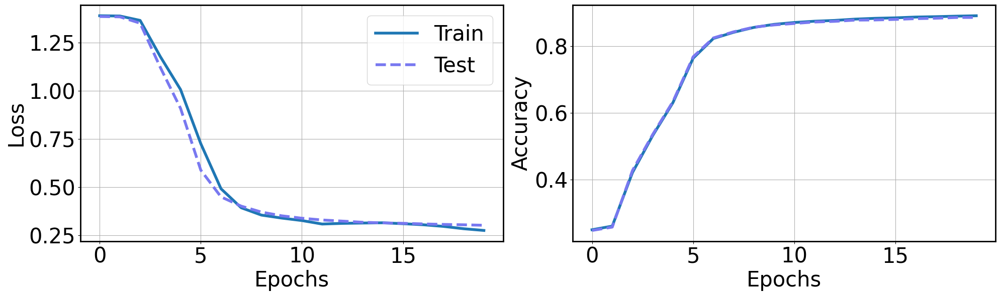

In [16]:
fig, axs = plt.subplots(1,2, figsize = (20,6))

axs[0].plot(train_losses, label = 'Train', lw = 4)
axs[0].plot(test_losses, label = 'Test',lw = 4, c = (120/255,120/255,240/255), ls = 'dashed')
axs[0].set_xlabel('Epochs', fontsize = 30)
axs[0].set_ylabel('Loss', fontsize = 30)
axs[0].legend(fontsize = 30)

axs[1].plot(train_accuracies/100, label = 'Train', lw = 4)
axs[1].plot(test_accuracies/100, label = 'Test', lw = 4, c = (120/255,120/255,240/255), ls = 'dashed')
axs[1].set_ylabel('Accuracy', fontsize = 30)
axs[1].set_xlabel('Epochs', fontsize = 30)

for i in range(2):
    axs[i].tick_params(axis='both', which='major', labelsize=30)
    axs[i].grid()
    for axis in ['top','bottom','left','right']:
        axs[i].spines[axis].set_linewidth(2)

plt.tight_layout()

# At this point we have a CNN model. We now simulate many CS diagrams in order to use the model to do charge tuning

In [17]:
from mlqe_2023_edx.week2 import QDotSimulator
import importlib
importlib.reload(QDotSimulator)

<module 'mlqe_2023_edx.week2.QDotSimulator' from '/home/joeaziz/Documents/Code/Qdots/mlqe_2023_edx/week2/QDotSimulator.py'>

In [21]:
csd = QDotSimulator.DoubleDot()
random_diagram_index = np.random.randint(4)

dcharge = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_dcharge.npy')

dcharge_noisy = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_dcharge_noisy.npy')

charge_state = np.load(f'./mlqe_2023_edx/week2/dataset/simulated_csds/simulated_csd_{random_diagram_index}_occupation.npy')

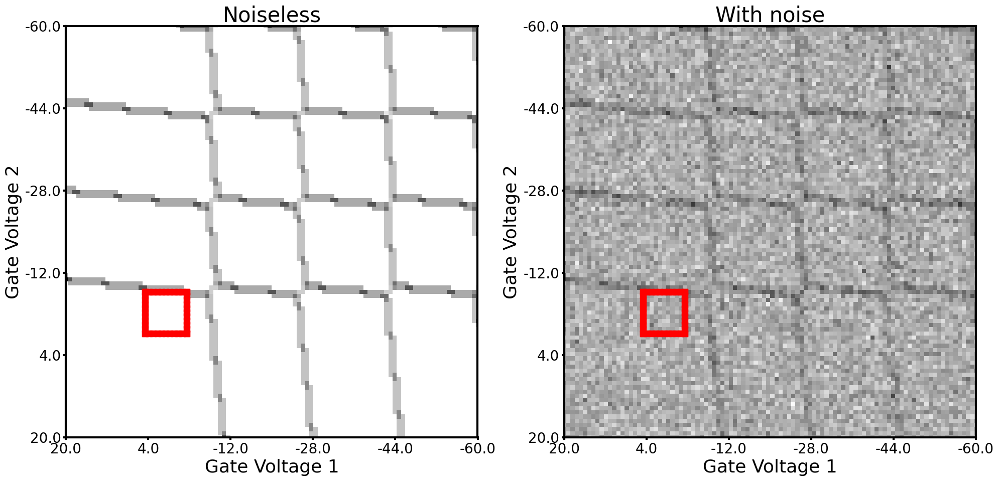

In [22]:
csd.import_csd(dcharge = dcharge, dcharge_noisy = dcharge_noisy)
csd.sample_window()
csd.plot_csd(with_window = True, show = True)

In [23]:
def transform_window(window):
    x = np.copy(window)
    # normalising
    x -= x.min()
    x /= x.max()
    
    x = x.reshape(1,1, x.shape[0], x.shape[1])
    x = torch.asarray(x).float().to(device)
    return x

In [29]:
x = transform_window(csd.window)
model.eval()
pred = model(x).argmax(1).item()

In [25]:
print(pred)

0


In [26]:
label_dic[pred]

'none'

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

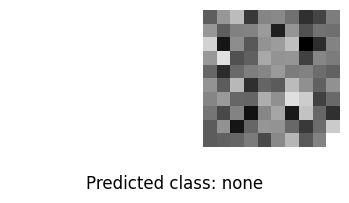

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

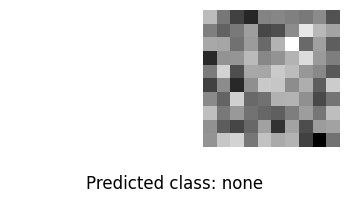

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

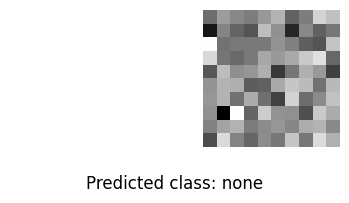

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

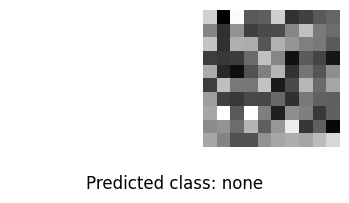

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

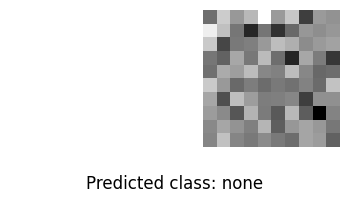

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: horizontal')

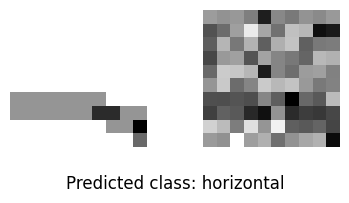

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: horizontal')

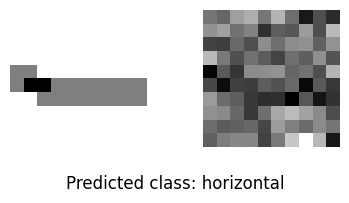

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

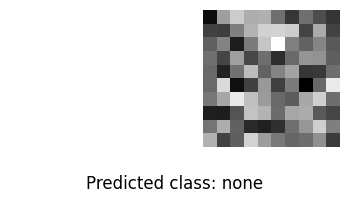

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: horizontal')

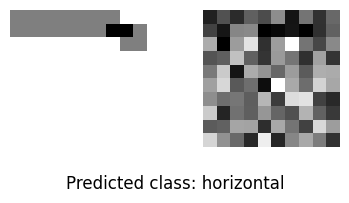

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

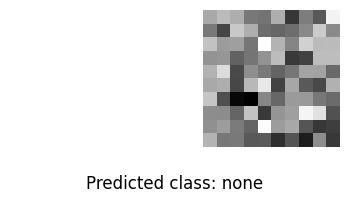

In [30]:
for _ in range(10):
    csd.sample_window()
    fig, axs = plt.subplots(1,2, figsize = (4,2))
    axs[0].imshow(csd.window_noiseless[::-1], cmap = 'binary')
    axs[1].imshow(csd.window[::-1], cmap = 'binary')
    axs[0].axis('off')
    axs[1].axis('off')
    pred = model(transform_window(csd.window[::-1]))
    fig.supxlabel('Predicted class: ' + str(label_dic[pred.argmax(1).item()]))
    plt.tight_layout()
    plt.show()
    plt.close()
    print('\n\n\n')

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

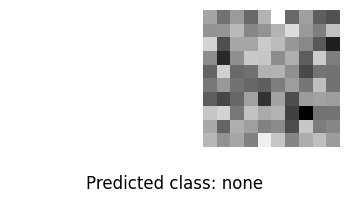

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

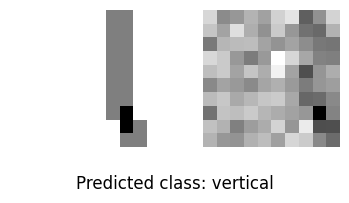

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

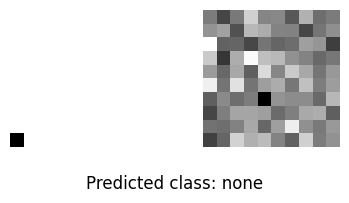

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

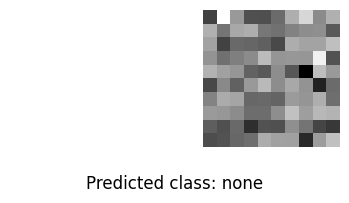

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: vertical')

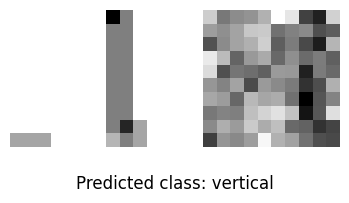

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: both')

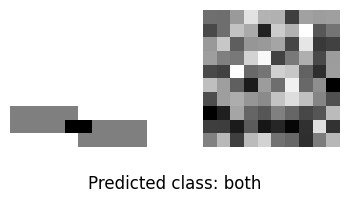

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: horizontal')

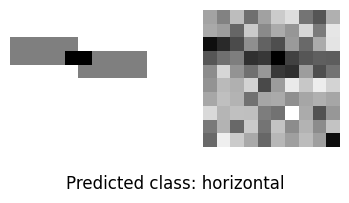

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: both')

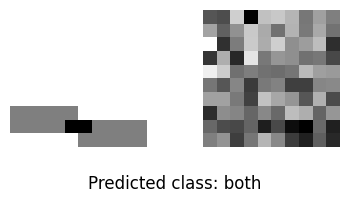

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

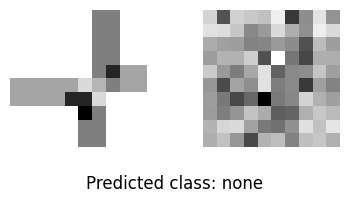

(-0.5, 9.5, 9.5, -0.5)

(-0.5, 9.5, 9.5, -0.5)

Text(0.5, 0.01, 'Predicted class: none')

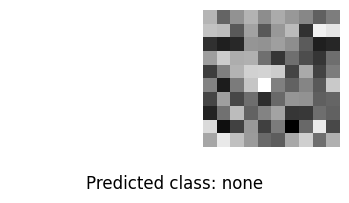

In [33]:
#### This shifter is designed specifically for reaching the (0,0) states, this is why we update with -=

def shifter(line, xmin, ymin, how_many_nones, how_many_stuck):
    xmin0 = xmin                                              # save initial value of xmin and ymin, to compare them to the end values, and if
    ymin0 = ymin                                              # it doesn't change for a while (how_many_stuck) stop the tuning routine
    
    deltaV = 10                                               # define by how many pixel the window will be shifted

    # basically is it possible to shift horizontal/vertical without leaving the entire diagram
    horizontal_possible = True if ymin-deltaV > 0 else False  # save variables that will allow horizontal and vertical shifts, just if they will not go out of the diagram
    vertical_possible = True if xmin-deltaV > 0 else False

    if line == 'none':
        how_many_nones += 1                                   # increment how many times the net classifies the window as having no line
        if horizontal_possible: ymin -= deltaV                # just tune the y-voltage if it's not going out of the diagram
        if vertical_possible: xmin -= deltaV                  # same for x voltage

    elif line == 'horizontal' and horizontal_possible:        # repeat the process for having horizontal line
        how_many_nones = 0
        ymin -= deltaV                                        # only tune the y-voltage
        pass

    elif line == 'vertical' and vertical_possible:            # repeat the process for having vertical line
        how_many_nones = 0
        xmin -= deltaV                                        # only tune the x-voltage
        pass

    elif line == 'both':                                      # repeat the process for having both horizontal and vertical line
        how_many_nones = 0
        if horizontal_possible: ymin -= deltaV                # tune both x-voltage and y-voltage
        if vertical_possible: xmin -= deltaV
        pass

    if xmin0 == xmin and ymin == ymin0:                       # if the initial pixel position didn't change, increment how_many_stuck by 1
        how_many_stuck += 1

    return xmin, ymin, how_many_nones, how_many_stuck

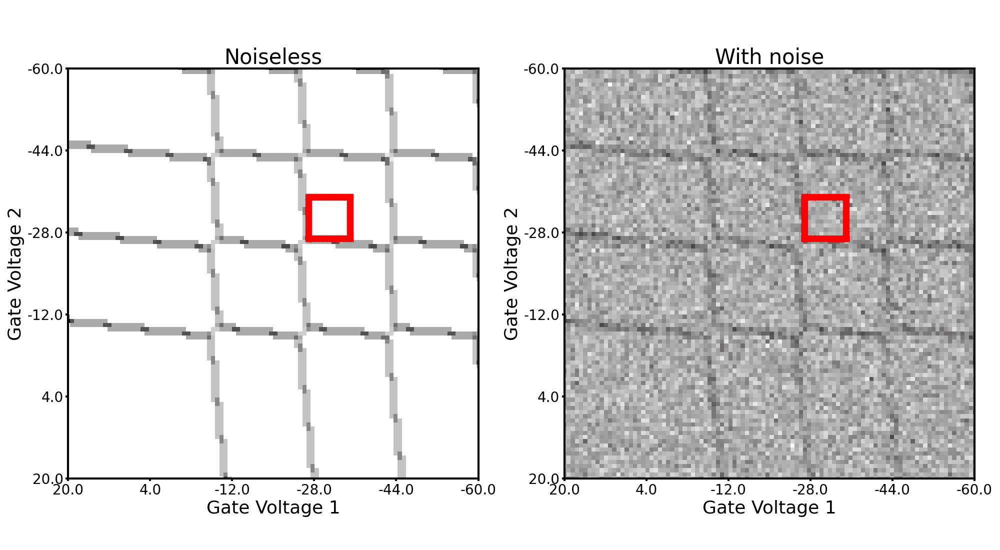

In [34]:
csd.window_xmin = np.random.randint(30,90)           # randomly sample a position for left corner of the window
csd.window_ymin = np.random.randint(30,90)

csd.sample_window(random = False)                    # sample the window and plot the diagram with it
csd.plot_csd(with_window = True, show = False)

how_many_nones = 0                                   # variable used as criteria to stop the tuner when goal is achieved
how_many_stuck = 0                                   # variable used as criteria to stop if the window cannot move anymore
                                                     # (because it would go out the diagram, for example)

steps_to_achieve_00 = 0                              # initialize how many steps are necesssary to achieve the goal
csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/00tuner_{steps_to_achieve_00}.jpg') # save the first diagram (with window) image

# we know we are in the (0,0) regime if we return no transitions 3 times in a row. 
while how_many_nones < 3:                            # stop the tuner if a window is classified as 'none' three times
    model.eval()
    line = label_dic[model(transform_window(csd.window)).argmax(1).item()]
    csd.window_xmin, csd.window_ymin, how_many_nones, how_many_stuck = shifter(line, csd.window_xmin, csd.window_ymin, how_many_nones, how_many_stuck)

    csd.sample_window(random = False)                # sample a new window
    csd.plot_csd(with_window = True, show = False)   # plot the CSD with the new sampled window
    steps_to_achieve_00 += 1                         # increment the number of steps
    if how_many_stuck > 3: break                     # stop if the tuner is stuck more than three times
    csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/00tuner_{steps_to_achieve_00}.jpg')


## Make a GIF to visualize the progress of the autotuner
frames = []
for step in range(steps_to_achieve_00+1):
    frames.append(Image.open(f"./mlqe_2023_edx/week2/tuner_figs/00tuner_{step}.jpg"))
frame_one = frames[0]
frame_one.save(f"./mlqe_2023_edx/week2/tuner_figs/00_autotuner.gif", format="GIF", append_images=frames,
            save_all=True, duration=1000, loop=0)

with open('./mlqe_2023_edx/week2/tuner_figs/00_autotuner.gif', 'rb') as f:
  display.Image(data = f.read(), format = 'png')

In [80]:
# Now at (0,0) we wish to write the code for a shifter that moves to a specific charge state

def specific_charge_shifter(line, xmin, ymin, current_state, final_state, how_many_stuck):

    deltaV = 5
    xmin0, ymin0 = xmin, ymin
    if line == 'none':
        if current_state[0] < final_state[0]: ymin += deltaV
        if current_state[1] < final_state[1]: xmin += deltaV
    elif line == 'horizontal':
        if current_state[0] < final_state[0]: 
            ymin += deltaV
            current_state[1] += 1
        else:
            ymin -= deltaV
            current_state[1] -= 1
    elif line == 'vertical':
        if current_state[1] < final_state[1]: 
            xmin += deltaV
            current_state[0] += 1
        else:
            xmin -= deltaV
            current_state[0] -= 1
    elif line == 'both':
        if current_state[1] < final_state[1] and current_state[0] < final_state[0]: 
            xmin += deltaV
            ymin += deltaV
            current_state[1] += 1
            current_state[0] += 1
    
    if xmin0 == xmin and ymin0 == ymin: how_many_stuck += 1

    pass

    return xmin, ymin, current_state, how_many_stuck

In [88]:
# The target charge state

final_state = np.array([1,2])

In [91]:
# Randomise the starting position

xmin00, ymin00 = np.random.randint(20), np.random.randint(20)

print(xmin00, ymin00)

13 16


# Building the tuning loop

none
[0. 0.]
none
[0. 0.]
none
[0. 0.]
none
[0. 0.]
none
[0. 0.]
none
[0. 0.]
none
[0. 0.]
both
[1. 1.]


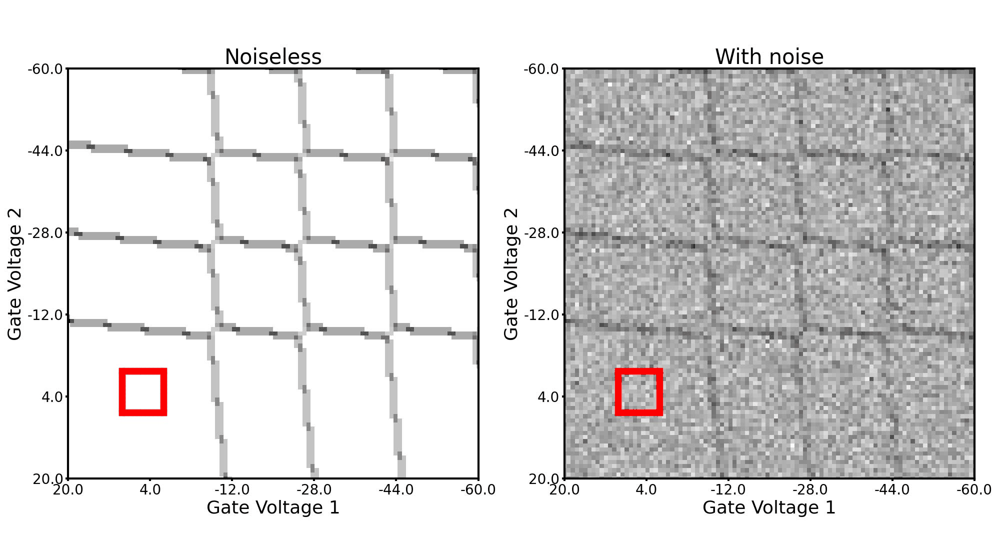

In [92]:
steps_to_final_state = 0                            # we initialize with 0 the number of steps iterate over until final state is achieved
current_state = np.zeros(2)                         # we initialize a current_state array with (0,0)
csd.window_xmin, csd.window_ymin = xmin00, ymin00   # we define in our csd object where we want our first window
csd.sample_window(random = False)                   # sample a first window
csd.plot_csd(with_window = True, show = False)      # and plot the CSD with the window
how_many_stuck = 0                                  # we intialize to 0 the number of iterations the tuner is stuck
csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{steps_to_final_state}.jpg')

while any(current_state != final_state):
    steps_to_final_state += 1

    model.eval()
    x = transform_window(csd.window)
    pred = model(x).argmax(1).item()
    line = label_dic[pred]
    # ### YOUR CODE HERE ### = specific_charge_shifter(### YOUR CODE HERE ###)

    csd.window_xmin, csd.window_ymin, current_state, how_many_stuck = specific_charge_shifter(line, csd.window_xmin, csd.window_ymin, current_state, final_state, how_many_stuck)
    
    if how_many_stuck > 3 or steps_to_final_state > 8 or csd.window_xmin >= 90 or csd.window_ymin >= 90:
      steps_to_final_state -= 1
      break
    csd.sample_window(random = False)
    csd.plot_csd(with_window = True, show = False)
    csd.fig.savefig(f'./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{steps_to_final_state}.jpg')
    print(line)
    print(current_state)

## Make a GIF to visualize the progress of the autotuner
frames = []
for step in range(steps_to_final_state+1):
    frames.append(Image.open(f"./mlqe_2023_edx/week2/tuner_figs/specific_charge_shifter{step}.jpg"))
frame_one = frames[0]
frame_one.save(f"./mlqe_2023_edx/week2/tuner_figs/specific_charge_autotuner.gif", format="GIF", append_images=frames,
            save_all=True, duration=1000, loop=0)

with open('./mlqe_2023_edx/week2/tuner_figs/specific_charge_autotuner.gif', 'rb') as f:
  display.Image(data = f.read(), format = 'png')